<a href="https://colab.research.google.com/github/Band3er/course-proj-VR/blob/main/ACV_Lab2_Part4_depthAnythingV3_demo_pyvista.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Laboratory Session 2: Dense Vision with Deep Learning**
**Date:** 07 March 2026   

**Authors**: Jesús Bermúdez Cameo y Alejandro Pérez Yus

**Version:** 1.0

## Part 4 (Optional): Full 3D estimation pipeline using deep learning

New depth estimation pipelines (VGGT, DA3) also approach multi view 3D estimation allowing them to also predict camera poses, camera calibration even directly point clouds (Dust3r, Mast3r, …) and with metric scale. In this part of the lab, we want to compare the previous result from a densification of a 3D SfM with the metric depth output of DepthAnything v3 which also provides calibration, and camera poses.




Using DepthAnythingv3 in colab requieres a Hugging Face secret token to be afforadable. For that you have to register in Hugging Face and create a token in "Access Token" section. Then copy the HASH of the token and paste it in the Secrets section of Google Colab (the key) naming the token as HF_TOKEN


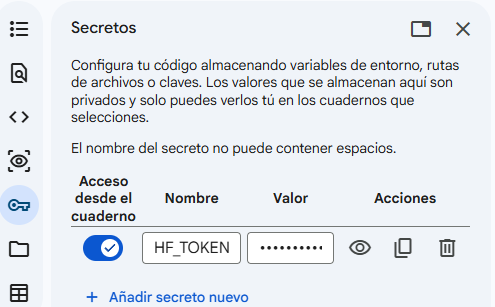

If you can not use the secret token you still can use the online demo in hugging face https://huggingface.co/spaces/depth-anything/depth-anything-3
The demo allows obtaining a .gbl file with a fused pointcloud and an estimation of the camera poses. This is the same .glb generated by DA3 when using the code version if activating the export flag.

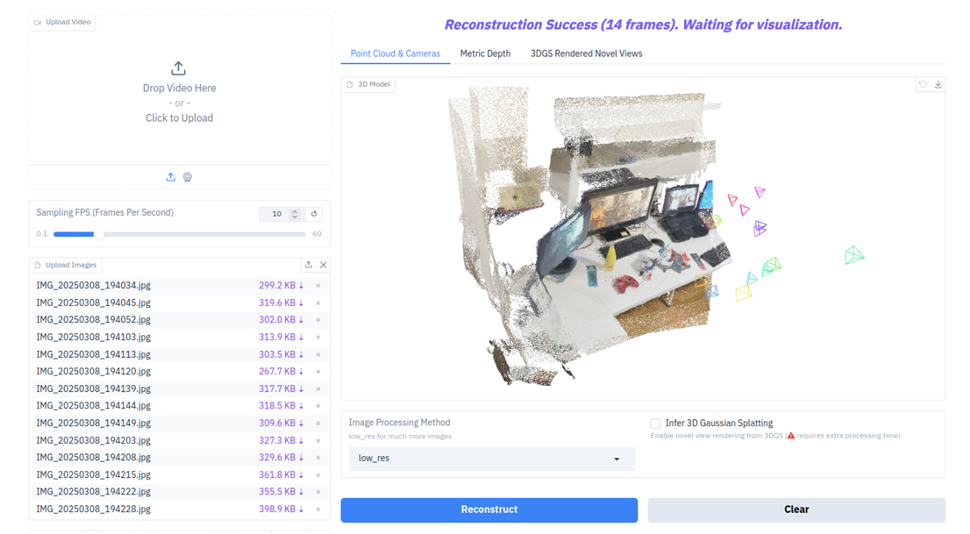



In both cases we will use trimesh for loading the fused pointcloud and pyvista to visualize the results.

In [ ]:
!pip install trimesh
!pip install pyvista[jupyter]

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 740.5/740.5 kB 15.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 201.3/201.3 kB 9.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 245.1/245.1 kB 32.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.5/44.5 kB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 781.7/781.7 kB 44.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.1/5.1 MB 102.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 145.6/145.6 MB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 122.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 96.5 MB/s eta 0:00:00


In [ ]:
# you can skip this install if using the online demo
!git clone https://github.com/ByteDance-Seed/Depth-Anything-3.git
!pip install -e /content/Depth-Anything-3

Cloning into 'Depth-Anything-3'...
remote: Enumerating objects: 356, done.
remote: Counting objects: 100% (245/245), done.
remote: Compressing objects: 100% (169/169), done.
remote: Total 356 (delta 141), reused 76 (delta 76), pack-reused 111 (from 1)
Receiving objects: 100% (356/356), 22.67 MiB | 16.24 MiB/s, done.
Resolving deltas: 100% (156/156), done.


In [ ]:
import torch
import matplotlib.pyplot as plt
import glob
from pathlib import Path
from PIL import Image
import numpy as np


In [ ]:
# you can skip this import if using the online demo
from depth_anything_3.api import DepthAnything3

In [ ]:
from google.colab import files
uploaded= files.upload()

Saving IMG_20250308_194052.jpg to IMG_20250308_194052.jpg
Saving IMG_20250308_194113.jpg to IMG_20250308_194113.jpg
Saving IMG_20250308_194139.jpg to IMG_20250308_194139.jpg


In [ ]:
img_path_str = './'

files_img = Path(img_path_str).glob('*.jpg')
imgs_name = [filename.stem for filename in files_img]


images_rgb = []
aspect_ratio = []
for filename in imgs_name:
    img = np.array(Image.open(img_path_str + filename + '.jpg'))
    images_rgb.append(img)
    aspect_ratio.append(img.shape[1]/img.shape[0])

n_views = len(images_rgb)

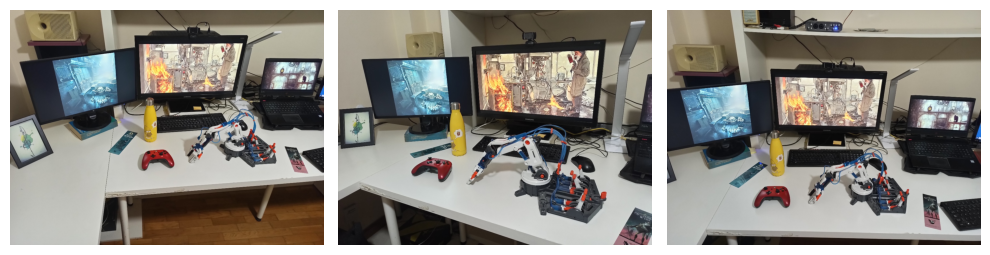

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(10, 30))

axes[0].imshow(images_rgb[0])
axes[0].axis('off')

axes[1].imshow(images_rgb[1])
axes[1].axis('off')

axes[2].imshow(images_rgb[2])
axes[2].axis('off')
plt.tight_layout()

In [ ]:
# you can skip this part if using the online demo
# Load model from Hugging Face Hub
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = DepthAnything3.from_pretrained("depth-anything/DA3NESTED-GIANT-LARGE-1.1")
model = model.to(device=device)

config.json: 0.00B [00:00, ?B/s]

[INFO ] using SwiGLU layer as FFN
[INFO ] using MLP layer as FFN


model.safetensors:   0%|          | 0.00/6.76G [00:00<?, ?B/s]

In [ ]:
# you can skip this part if using the online demo
prediction = model.inference(
    images_rgb,
    export_dir="output",
    export_format="glb"  # Options: glb, npz, ply, mini_npz, gs_ply, gs_video
            )

[INFO ] Processed Images Done taking 0.18663597106933594 seconds. Shape:  torch.Size([3, 3, 378, 504])
[INFO ] Selecting reference view using strategy: saddle_balanced
[INFO ] Model Forward Pass Done. Time: 6.971712589263916 seconds
[INFO ] Conversion to Prediction Done. Time: 0.004082441329956055 seconds
[INFO ] conf_thresh_percentile: 40.0
[INFO ] num max points: 1000000
[INFO ] Exporting to GLB with num_max_points: 1000000
[INFO ] Export Results Done. Time: 0.861208438873291 seconds


In prediction object the model provides a tensor with the depth-maps (metric) for each image (depth), another tensor with the poses of the cameras (extrinsics) and one with the calibration of the cámeras (intrinsics). The pipeline also exports a file with a fused pointcloud using the depth from all the views.

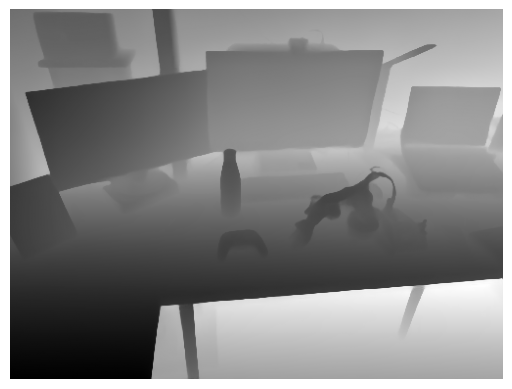

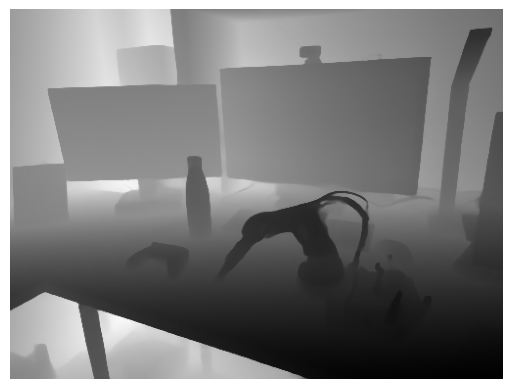

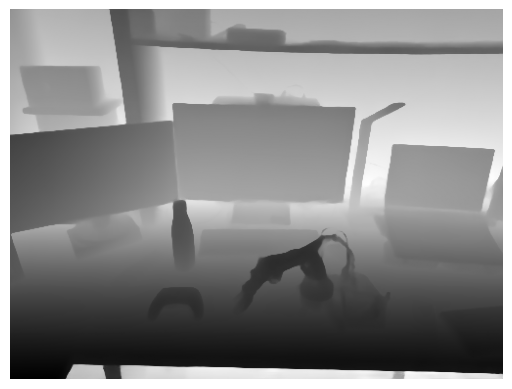

In [ ]:
# you can skip this part if using the online demo
plt.figure(1)
plt.imshow(prediction.depth[0],cmap='gray')
plt.axis('off')
plt.show()

plt.figure(2)
plt.imshow(prediction.depth[1],cmap='gray')
plt.axis('off')
plt.show()

plt.figure(3)
plt.imshow(prediction.depth[2],cmap='gray')
plt.axis('off')
plt.show()


In [ ]:
# you can skip this part if using the online demo

np.savez('output/depth.npz', depth=prediction.depth)
np.savez('output/extrinsics.npz', extrinsics=prediction.extrinsics)
np.savez('output/intrinsics.npz', intrinsics=prediction.intrinsics)
np.savez('output/prediction.npz', prediction=prediction)

# The extrinsics are the orientation matrix and position of the abs ref seen from each camera.
T_cam1_abs = np.vstack((prediction.extrinsics[0],np.array([[0,0,0,1]])))
T_cam2_abs = np.vstack((prediction.extrinsics[1],np.array([[0,0,0,1]])))
T_cam3_abs = np.vstack((prediction.extrinsics[2],np.array([[0,0,0,1]])))

# Intrinsics are the 3x3 linear calibration matrix
K_c1 = prediction.intrinsics[0]
K_c2 = prediction.intrinsics[1]
K_c3 = prediction.intrinsics[2]

Now we are going to load the exported .glb file to visualize the fused model.

In [ ]:
# if you have used the code pipeline you don't need to load the file. The file should be at './output/scene.glb'. if not load the file downloaded from the online demo.
uploaded= files.upload()

Saving scene.glb to scene.glb


In [ ]:
import trimesh
import pyvista as pv
pv.set_jupyter_backend('html')
pv.global_theme.notebook = True # otherwise nothing plots

In [ ]:
import numpy as np

def extract_camera_from_pyramid(path_geometry,aspect_ratio):
    path_geometry.vertices

    verts = np.array(path_geometry.vertices)

    vert_A = verts[7,:]
    vert_B = verts[3,:]
    vert_C = verts[0,:]
    vert_D = verts[1,:]
    vert_E = verts[5,:]

    optical_center = vert_E

    c_o_sq = vert_A + (vert_B-vert_A)/2 + (vert_C-vert_A)/2
    Z_axis = c_o_sq - optical_center
    X_axis = vert_B-vert_A
    Y_axis = vert_C-vert_A

    if abs(np.linalg.norm(X_axis)/np.linalg.norm(Y_axis)-aspect_ratio)>abs(np.linalg.norm(Y_axis)/np.linalg.norm(X_axis)-aspect_ratio):
        X_axis, Y_axis = Y_axis, X_axis

    X_axis_n = X_axis/np.linalg.norm(X_axis)
    Y_axis_n = Y_axis/np.linalg.norm(Y_axis)
    Z_axis_n = Z_axis/np.linalg.norm(Z_axis)

    R_abs_c = np.vstack((X_axis_n, np.cross(Z_axis_n,X_axis_n),Z_axis_n)).T

    T_abs_c = np.vstack((np.hstack((R_abs_c,optical_center.reshape((3,1)))),np.array([0,0,0,1])))

    return T_abs_c

In [ ]:
glb_path = './output/scene.glb'

scene = trimesh.load(glb_path)

T_abs_cam1_gbl = extract_camera_from_pyramid(scene.geometry['geometry_1'],aspect_ratio=aspect_ratio[0])
T_abs_cam2_gbl = extract_camera_from_pyramid(scene.geometry['geometry_2'],aspect_ratio=aspect_ratio[1])
T_abs_cam3_gbl = extract_camera_from_pyramid(scene.geometry['geometry_3'],aspect_ratio=aspect_ratio[2])

r_matrix_1, origin_1 = T_abs_cam1_gbl[0:3,0:3], T_abs_cam1_gbl[0:3,3]
r_matrix_2, origin_2 = T_abs_cam2_gbl[0:3,0:3], T_abs_cam2_gbl[0:3,3]
r_matrix_3, origin_3 = T_abs_cam3_gbl[0:3,0:3], T_abs_cam3_gbl[0:3,3]

In [ ]:
plotter = pv.Plotter(title="3D View")
plotter.add_axes()
plotter.show_grid()

for name, geom in scene.geometry.items():
    if isinstance(geom, trimesh.PointCloud):
        cloud = pv.PolyData(geom.vertices)
        if hasattr(geom, 'colors'):
            cloud["colors"] = geom.colors[:, :3] / 255.0
            plotter.add_mesh(cloud, scalars="colors", rgb=True, point_size=2)
        else:
            plotter.add_mesh(cloud, color="white", point_size=2)

    elif isinstance(geom, trimesh.path.path.Path3D):
        points = geom.vertices
        num_lines = len(points) - 1
        lines = np.hstack([[2, i, i+1] for i in range(num_lines)])
        path_mesh = pv.PolyData(points, lines=lines)
        plotter.add_mesh(path_mesh, color="red", line_width=3, label="Cameras")


camera_centers = pv.PolyData(np.vstack((origin_1,origin_2,origin_3)))
sphere = pv.Sphere(radius=0.01)
glyphs_actor = plotter.add_mesh(
    camera_centers.glyph(geom=sphere),
    color="lime",
    label="Numpy calc",
    name="capa_numpy"
)

flecha_x = pv.Arrow(start=origin_1, direction=r_matrix_1[:,0], scale=0.1)
flecha_y = pv.Arrow(start=origin_1, direction=r_matrix_1[:,1], scale=0.1)
flecha_z = pv.Arrow(start=origin_1, direction=r_matrix_1[:,2], scale=0.1)

plotter.add_mesh(flecha_x, color="red", label="X Axis")
plotter.add_mesh(flecha_y, color="green", label="Y Axis")
plotter.add_mesh(flecha_z, color="blue", label="Z Axis")

flecha_x = pv.Arrow(start=origin_2, direction=r_matrix_2[:,0], scale=0.1)
flecha_y = pv.Arrow(start=origin_2, direction=r_matrix_2[:,1], scale=0.1)
flecha_z = pv.Arrow(start=origin_2, direction=r_matrix_2[:,2], scale=0.1)

plotter.add_mesh(flecha_x, color="red", label="X Axis")
plotter.add_mesh(flecha_y, color="green", label="Y Axis")
plotter.add_mesh(flecha_z, color="blue", label="Z Axis")

flecha_x = pv.Arrow(start=origin_3, direction=r_matrix_3[:,0], scale=0.1)
flecha_y = pv.Arrow(start=origin_3, direction=r_matrix_3[:,1], scale=0.1)
flecha_z = pv.Arrow(start=origin_3, direction=r_matrix_3[:,2], scale=0.1)

plotter.add_mesh(flecha_x, color="red", label="X Axis")
plotter.add_mesh(flecha_y, color="green", label="Y Axis")
plotter.add_mesh(flecha_z, color="blue", label="Z Axis")


plotter.show_grid(
    grid=True,
    location='outer',
    ticks='both',
    color='gray',
    xtitle="X", ytitle="Y", ztitle="Z"
)

plotter.add_floor(color='darkgray', opacity=0.5)

plotter.add_axes()

plotter.show()

/tmp/ipykernel_601/3876874397.py:25: UserWarning: No data to use for scale. scale will be set to False.
  camera_centers.glyph(geom=sphere),
/tmp/ipykernel_601/3876874397.py:25: UserWarning: No vector-like data to use for orient. orient will be set to False.
  camera_centers.glyph(geom=sphere),


EmbeddableWidget(value='<iframe srcdoc="<!DOCTYPE html>\n<html>\n  <head>\n    <meta http-equiv=&quot;Content-…

DepthAnything v3 allows directly exporting a Gaussian Splatting representation of the reconstructed model by installing a nerfstudio library.

That is done by installing the following library

`!pip install --no-build-isolation git+https://github.com/nerfstudio-project/gsplat.git@0b4dddf04cb687367602c01196913cde6a743d70 # for gaussian head`

and running the model as follows:

```
prediction = model.inference(
    images_rgb,
    infer_gs = True,
    export_dir="output",
    export_format="gs_ply"  # Options: glb, npz, ply, mini_npz, gs_ply, gs_video
)
```
However, free Colab does not provide enough VRAM for testing in a lab 😞. Instead, we can use external software for that. For that, we are going to export the pointcloud and the files as a COLMAP project.








In [ ]:
def compute_visibility(u, v, z_depth, img_w, img_h):
    """
    Calcula la visibilidad de puntos 3D proyectados (Z-buffer).

    Args:
        u (np.array): Coordenadas x en la imagen (float).
        v (np.array): Coordenadas y en la imagen (float).
        z_depth (np.array): Profundidad Z de cada punto.
        img_w (int): Ancho de la imagen.
        img_h (int): Alto de la imagen.

    Returns:
        np.array (bool): Array del mismo tamaño que u/v.
                         True si el punto es visible, False si está ocluido o fuera de imagen.
    """
    n_points = len(u)

    is_visible = np.zeros(n_points, dtype=bool)


    u_px = np.round(u).astype(np.int32)
    v_px = np.round(v).astype(np.int32)


    valid_mask = (u_px >= 0) & (u_px < img_w) & \
                 (v_px >= 0) & (v_px < img_h) & \
                 (z_depth > 0)

    if not np.any(valid_mask):
        return is_visible


    valid_indices = np.where(valid_mask)[0]

    u_valid = u_px[valid_indices]
    v_valid = v_px[valid_indices]
    z_valid = z_depth[valid_indices]


    pixel_linear_idx = v_valid * img_w + u_valid


    sort_order = np.lexsort((z_valid, pixel_linear_idx))

    sorted_pixel_idx = pixel_linear_idx[sort_order]
    sorted_orig_indices = valid_indices[sort_order]


    _, unique_first_indices = np.unique(sorted_pixel_idx, return_index=True)

    visible_point_indices = sorted_orig_indices[unique_first_indices]

    is_visible[visible_point_indices] = True

    return is_visible

def qvec2rotmat(qvec):
    return np.array(
        [
            [
                1 - 2 * qvec[2] ** 2 - 2 * qvec[3] ** 2,
                2 * qvec[1] * qvec[2] - 2 * qvec[0] * qvec[3],
                2 * qvec[3] * qvec[1] + 2 * qvec[0] * qvec[2],
            ],
            [
                2 * qvec[1] * qvec[2] + 2 * qvec[0] * qvec[3],
                1 - 2 * qvec[1] ** 2 - 2 * qvec[3] ** 2,
                2 * qvec[2] * qvec[3] - 2 * qvec[0] * qvec[1],
            ],
            [
                2 * qvec[3] * qvec[1] - 2 * qvec[0] * qvec[2],
                2 * qvec[2] * qvec[3] + 2 * qvec[0] * qvec[1],
                1 - 2 * qvec[1] ** 2 - 2 * qvec[2] ** 2,
            ],
        ]
    )


def rotmat2qvec(R):
    Rxx, Ryx, Rzx, Rxy, Ryy, Rzy, Rxz, Ryz, Rzz = R.flat
    K = (
        np.array(
            [
                [Rxx - Ryy - Rzz, 0, 0, 0],
                [Ryx + Rxy, Ryy - Rxx - Rzz, 0, 0],
                [Rzx + Rxz, Rzy + Ryz, Rzz - Rxx - Ryy, 0],
                [Ryz - Rzy, Rzx - Rxz, Rxy - Ryx, Rxx + Ryy + Rzz],
            ]
        )
        / 3.0
    )
    eigvals, eigvecs = np.linalg.eigh(K)
    qvec = eigvecs[[3, 0, 1, 2], np.argmax(eigvals)]
    if qvec[0] < 0:
        qvec *= -1
    return qvec


def extract_camera_from_pyramid(path_geometry,aspect_ratio):
    path_geometry.vertices

    verts = np.array(path_geometry.vertices)

    vert_A = verts[7,:]
    vert_B = verts[3,:]
    vert_C = verts[0,:]
    vert_D = verts[1,:]
    vert_E = verts[5,:]

    optical_center = vert_E

    c_o_sq = vert_A + (vert_B-vert_A)/2 + (vert_C-vert_A)/2
    Z_axis = c_o_sq - optical_center
    X_axis = vert_B-vert_A
    Y_axis = vert_C-vert_A

    if abs(np.linalg.norm(X_axis)/np.linalg.norm(Y_axis)-aspect_ratio)>abs(np.linalg.norm(Y_axis)/np.linalg.norm(X_axis)-aspect_ratio):
        X_axis, Y_axis = Y_axis, X_axis

    X_axis_n = X_axis/np.linalg.norm(X_axis)
    Y_axis_n = Y_axis/np.linalg.norm(Y_axis)
    Z_axis_n = Z_axis/np.linalg.norm(Z_axis)

    R_abs_c = np.vstack((X_axis_n, np.cross(Z_axis_n,X_axis_n),Z_axis_n)).T

    T_abs_c = np.vstack((np.hstack((R_abs_c,optical_center.reshape((3,1)))),np.array([0,0,0,1])))

    return T_abs_c

If we have run the colab version of DepthAnythingv3 we have available the estimation of the calibration. However, since we want to use the original images instead of the reduced ones used by DA3 we will export the original calibration that corresponds to the "big" images. The extrinsic estimations from DA3 predictions are in a different reference than the pointcloud imported from the .glb file. That is the reason we use the cameras obtained from the .glb file.


In [ ]:
K_c = np.array([[892.2407265,0.,581.52495987],
            [0.,891.38554393,429.80023058],
            [0.,0.,1.]])
K_ck = [K_c]*n_views

In [ ]:
import os


k_cam = 0
T_abs_camk = []
T_camk_abs = []
q_camk_abs = []
for name, geom in scene.geometry.items():
    if isinstance(geom, trimesh.PointCloud):
        X3D_abs = geom.vertices
        X3D_colors = geom.colors

    elif isinstance(geom, trimesh.path.path.Path3D):
        T_abs_cam = extract_camera_from_pyramid(geom,aspect_ratio=aspect_ratio[k_cam])
        T_cam_abs = np.linalg.inv(T_abs_cam)
        T_abs_camk.append(T_abs_cam)
        T_camk_abs.append(T_cam_abs)
        q_camk_abs.append(rotmat2qvec(T_cam_abs[0:3,0:3]))

        k_cam = k_cam + 1

Xh_abs = np.hstack((X3D_abs,np.ones((X3D_abs.shape[0],1)))).T




point_tracks = {i: [] for i in range(len(X3D_abs))}
images_info = []


for k_view in range(n_views):
    img_id = k_view + 1
    cam_id = k_view + 1

    Xh_cam = T_camk_abs[k_view] @ Xh_abs

    x = K_ck[k_view] @ np.eye(3,4) @ Xh_cam
    x = x/x[2,:]

    u = x[0,:]
    v = x[1,:]

    z_depth = Xh_cam[2,:]

    img_h,img_w = images_rgb[k_view].shape[0],images_rgb[k_view].shape[1]


    is_visible = compute_visibility(u, v, z_depth, img_w, img_h)

    valid_indices = np.where(is_visible)[0]
    observations = []

    for feat_idx, pt3d_idx in enumerate(valid_indices):
        # Guardamos la proyección 2D
        observations.append({
            'x': u[pt3d_idx],
            'y': v[pt3d_idx],
            'id3d': pt3d_idx
        })
        # Llenamos el track para el punto 3D
        point_tracks[pt3d_idx].append((img_id, feat_idx))

    images_info.append({
        'id': img_id,
        'cam_id': cam_id,
        'q': q_camk_abs[k_view],
        't':  T_camk_abs[k_view][0:3,3],
        'name': imgs_name[k_view] + '.jpg',
        'obs': observations
    })


output_dir = './colmap_out_nviews/'
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# --- 2. WRITE CAMERAS.TXT ---
with open(os.path.join(output_dir, "cameras.txt"), "w") as f:
    f.write("# CAMERA_ID, MODEL, WIDTH, HEIGHT, PARAMS[]\n")
    for i, K in enumerate(K_ck):
        height,width = images_rgb[i].shape[0], images_rgb[i].shape[1]
        #PINHOLE model: f_x, f_y, c_x, c_y
        f.write(f"{i+1} PINHOLE {width} {height} {K[0,0]} {K[1,1]} {K[0,2]} {K[1,2]}\n")

# --- 3. WRITE IMAGES.TXT ---
with open(os.path.join(output_dir, "images.txt"), "w") as f:
    for img in images_info:
        # Line 1: Extrinsics
        q, t = img['q'], img['t']
        f.write(f"{img['id']} {q[0]} {q[1]} {q[2]} {q[3]} {t[0]} {t[1]} {t[2]} {img['cam_id']} {img['name']}\n")
        # Line 2: Points 2D (x, y, point3D_id)
        row2 = []
        for ob in img['obs']:
            row2.extend([str(ob['x']), str(ob['y']), str(ob['id3d'])])
        f.write(" ".join(row2) + "\n")

# --- 4. WRITE POINTS3D.TXT ---
with open(os.path.join(output_dir, "points3D.txt"), "w") as f:
    for pt_id, tracks in point_tracks.items():
        if not tracks: continue

        p = X3D_abs[pt_id]
        c = X3D_colors[pt_id].astype(int)
        # POINT3D_ID, X, Y, Z, R, G, B, ERROR, TRACK[]
        track_str = " ".join([f"{img_id} {feat_idx}" for img_id, feat_idx in tracks])
        f.write(f"{pt_id} {p[0]} {p[1]} {p[2]} {c[0]} {c[1]} {c[2]} 0 {track_str}\n")

print(f"Colmap files generated at: {output_dir}")

Colmap files generated at: ./colmap_out_nviews/


Once we have exported the files `points3D.txt`, `images.txt` and `cameras.txt` we have to download them from `colmap_out_nviews` and put them in a folder with the original .jpg images.

We are going to use Brush https://github.com/ArthurBrussee/brush/releases for visualizing and fitting Gaussian Splatting models. There is also an online version at https://arthurbrussee.github.io/brush-demo/

An alternative for visualizing and edditing GS is https://superspl.at/editor

You can download a Gaussian Splatting model of the desktop of the lab from:

https://drive.google.com/file/d/1vF9hv7y_Zl4DX8aPltWUfR-Hqr2ZVtVX/view?usp=drive_link

You can download additional GS models from:

https://drive.google.com/file/d/1kHkNqGFLLutRt3R7k2tGkjGwfXnPLnCi/view?usp=sharing

https://drive.google.com/file/d/1jf4bjaeTGeru1PQS_Ue716uc_edRbAPd/view?usp=sharing

https://drive.google.com/file/d/1O89SIHcWdmrWi75Cf6tDrv2Dl6yGndcz/view?usp=sharing

https://drive.google.com/file/d/13FEQ7UZHYwymBTwxzpPeJob4cr8VxUTV/view?usp=sharing

https://drive.google.com/file/d/13FEQ7UZHYwymBTwxzpPeJob4cr8VxUTV/view?usp=sharing








For visualizing a Gaussain Splatting exported model from brush just use the `File` button in the load data section.

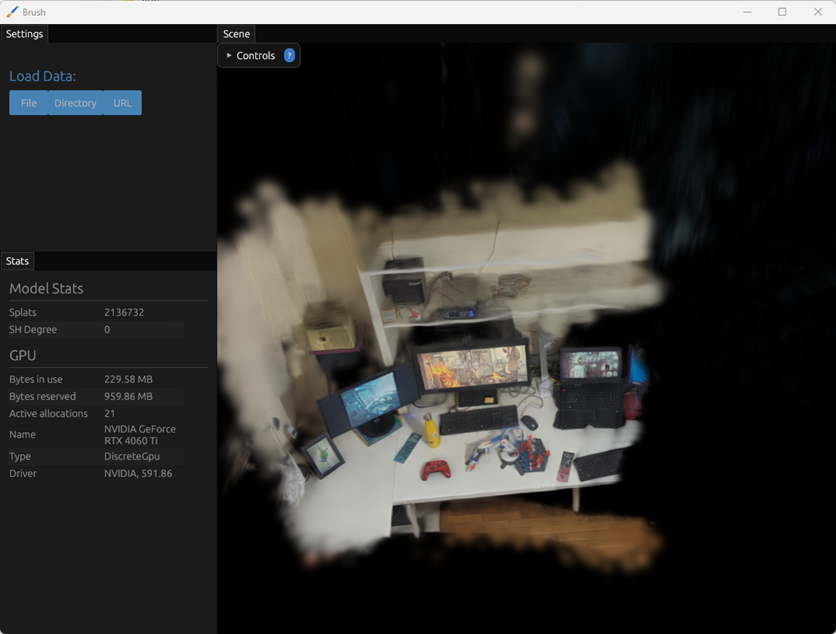

For fitting a Gaussian Splatting from brush just use the `Directory` button in the load data section and select the folder where you have exported the COLMAP txt format files.

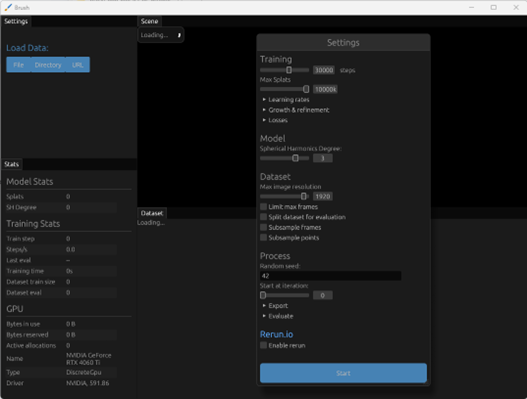

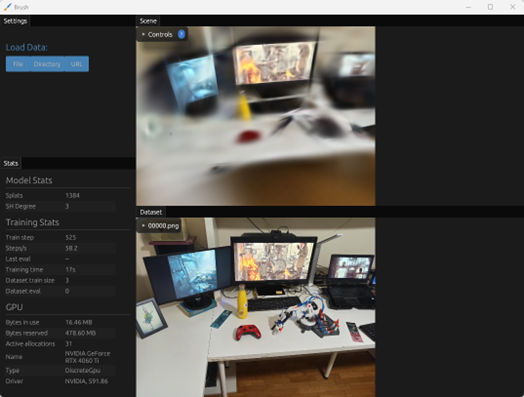

**Task (Optional):** Use your own images (you can use your own cellphone) to obtain a dense reconstruction with depth anything v3 and use it for training a Gaussian Splatting model.

**Tip1:** If you use DA3 in colab you are going to get a calibration for each camera at `prediction.intrinsics` .However, this calibration is for the reduced images contained in `prediction.processed_images` which have less resolution. Solutions: (1) You can use prediction.processed_images for the whole pipeline, (2) adapt the calibration values for the original resolution of the images or (3) obtain the calibration from another way (this is the unique option if you use the demo online).

**Tip2:** It could be interesting to explore the behaviour in outdoor scenes. If you use your images from Computer Vision (69151) you already have the calibration.